In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import glob

plt.rcParams['figure.figsize'] = [8, 6]
plt.rcParams['font.size'] = 15

In [2]:
dct = {}
for k in glob.glob('../data/*alpha_calibration.p'):
    in_df = pd.read_pickle(k)
    dct[k.split('/')[2][:-20]] = in_df
df = pd.concat(dct)

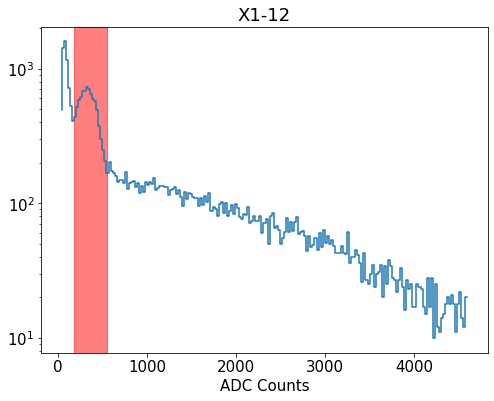

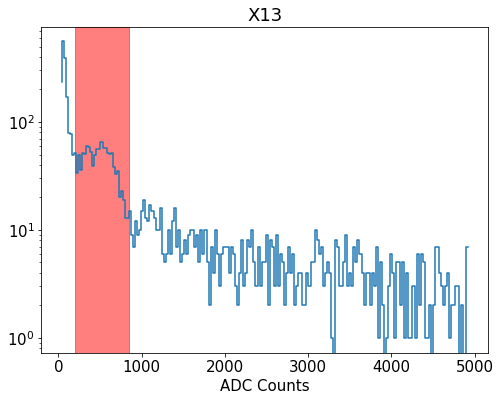

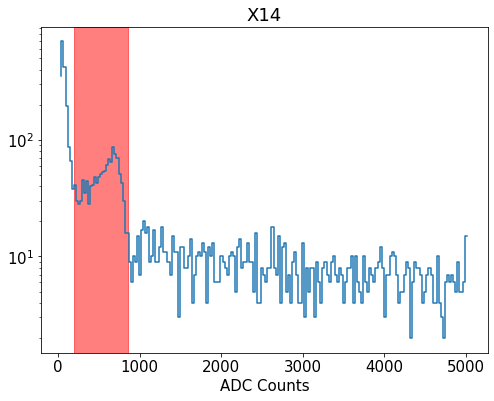

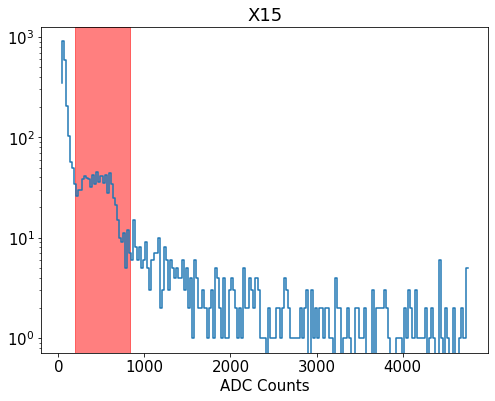

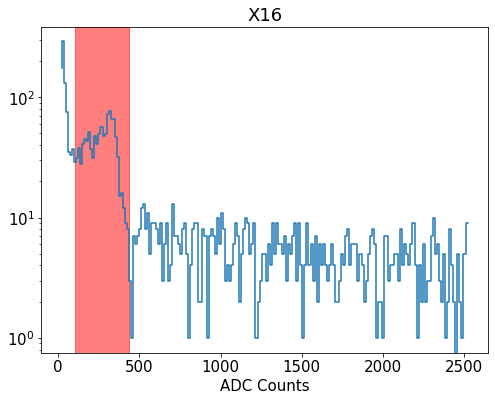

...

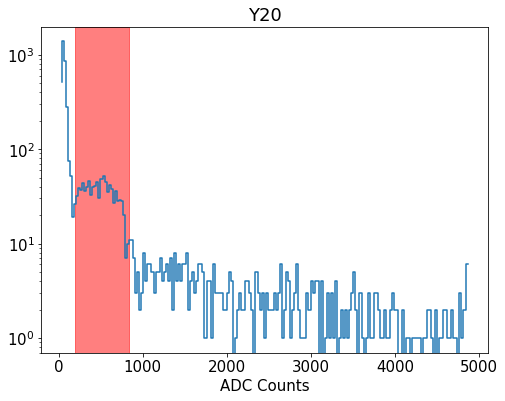

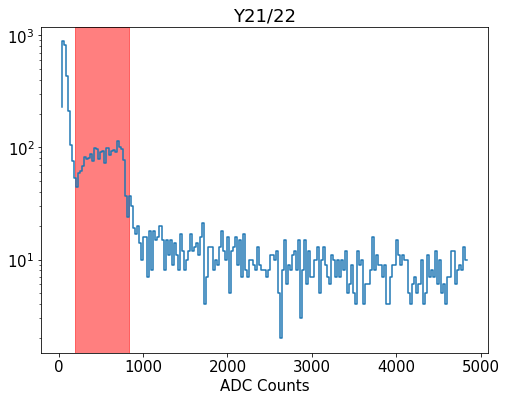

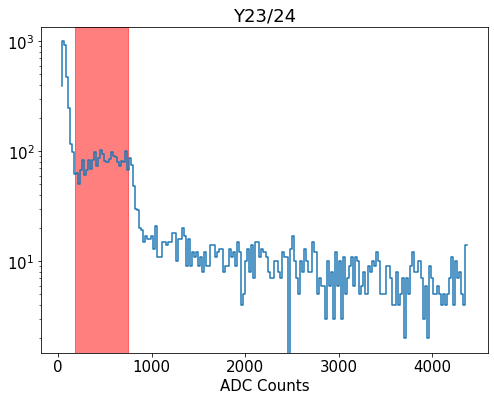

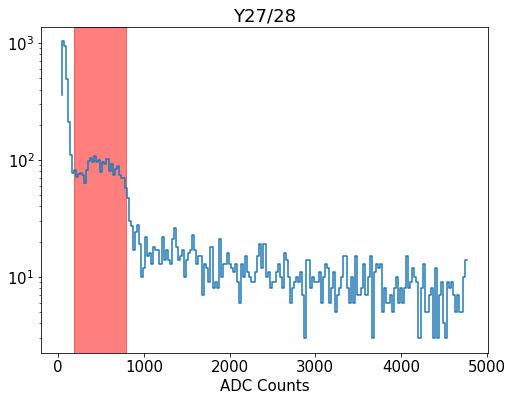

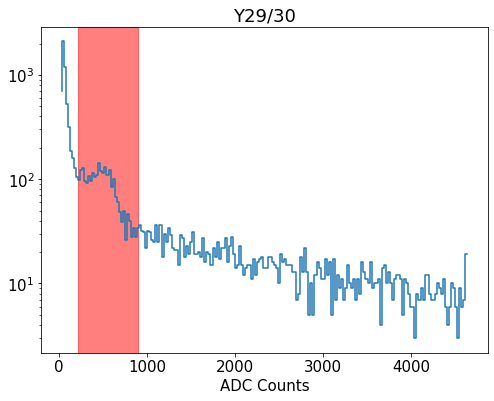

In [3]:
cut_range = []
calib_value = pd.read_csv('/g/g90/jacopod/software/TMSAnalysis/config/30th/Calibrations_Xe_Run11b.csv',\
                        index_col='ChannelName')
for ch,v in df.groupby(level=1):
    gain1 = gain2 = 1
    plt.title(ch)
    plt.step(np.mean(v['bins'])[:-1],np.sum(v['value']))
    plt.yscale('log')
    plt.xlabel('ADC Counts')
    cal_val = calib_value['Calibration'].loc[ch]
    if ch =='X1-12':
        gain2 = 0.7
    if ch =='X19':
        cal_val = calib_value['Calibration'].loc[ch]*10
        gain1 = 1.6
    if ch == 'X27/28':
        gain1 = gain2 = 0.6
    if ch == 'X29/30':
        gain1 = gain2 = 2.0
    if ch == 'Y1-10':
        gain1 = gain2 = 1.7
    first = 200.0/cal_val*gain1
    second = 850.0/cal_val*gain2
    ax = plt.gca()
    ax.axvspan(first, second, alpha=0.5, color='red')
    plt.show()
    cut_range.append([first,second])

compact_df = pd.DataFrame()
folder = None
path_to_reduced = '/p/lustre1/jacopod/30th/'
for i in df['index'].index:
    output_series = pd.Series()
    if folder == i[0]:
        pass
    else:
        folder = i[0]
        df_data = pd.read_pickle(path_to_reduced + folder + '/analysis_500ns/reduced_added.p')
    data = df_data.loc[df['index'].loc[i]]
    output_series = data
    output_series['cut_channel'] = [i[1]]*len(data)
    compact_df = compact_df.append(output_series,ignore_index=True)
compact_df.to_hdf('../data/alpha_SC_cut.h5',key='df')

In [4]:
aggregate = df[['bins','value']].sum(level=1)['value']
bn_center = df[['bins','value']].sum(level=1)['bins']/len(np.unique(df.index.get_level_values(0)))

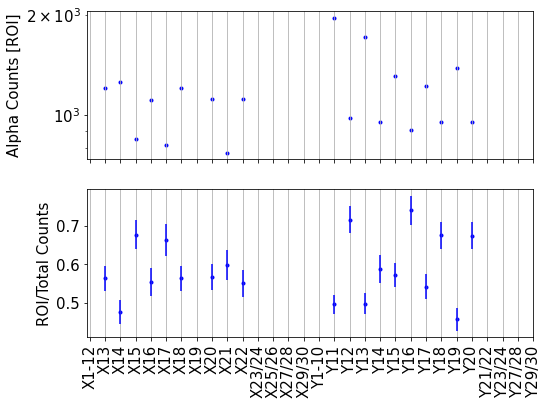

In [14]:
alpha_centroid =[]
fig,(ax1,ax2) = plt.subplots(2,1,sharex=True)

for i,ch in enumerate(bn_center.index):
    if '/' in ch:
        marker = 'x'
        continue
    elif '-' in ch:
        marker = 'd'
        continue
    elif 'X19' in ch:
        continue
    else:
        marker = '.'
    a = np.where(bn_center.loc[ch]<cut_range[i][0])[0][-1]
    b = np.where(bn_center.loc[ch]>cut_range[i][1])[0][0]

    alpha_centroid.append(np.average(bn_center.loc[ch][a:b],weights=aggregate.loc[ch][a:b]))
    ax1.scatter(i,sum(aggregate.loc[ch][a:b]),color='blue',marker=marker)
    ax1.errorbar(i,sum(aggregate.loc[ch][a:b]),color='blue')
    ax1.set_yscale('log')
    ax2.scatter(i,sum(aggregate.loc[ch][a:b])/sum(aggregate.loc[ch][a:]),color='blue',marker=marker)
    ax2.errorbar(i,sum(aggregate.loc[ch][a:b])/sum(aggregate.loc[ch][a:]),\
                 np.sqrt(1/sum(aggregate.loc[ch][a:b])+1/sum(aggregate.loc[ch])),color='blue')

ax1.set_ylabel('Alpha Counts [ROI]')
ax2.set_ylabel('ROI/Total Counts')
ax1.set_xticks(range(i+1))  
ax2.set_xticks(range(i+1))
ax2.set_xticklabels(bn_center.index.to_list(), rotation=90)
ax1.grid(True,axis='x')
ax2.grid(True,axis='x')
plt.show()

In [6]:
old_cal = pd.read_csv('../../software/TMSAnalysis/config/Calibrations_Xe_Run11b.csv')
alpha_centroid = np.asarray(alpha_centroid)/alpha_centroid[2]
old_calib = old_cal['Calibration']/old_cal['Calibration'][2]

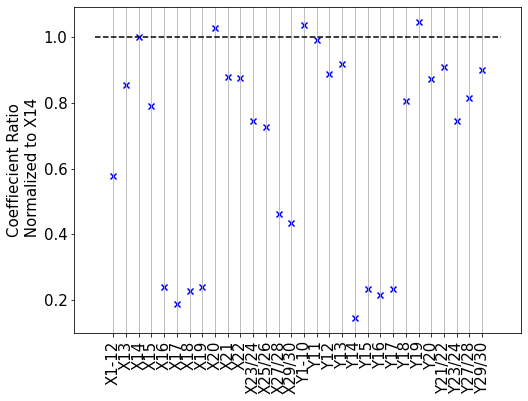

In [7]:
for ix,e in enumerate(alpha_centroid):
    ixd = ix
    if ix == 7:
        e *= 10
    if ix>27:
        ixd = ix+1
    #plt.scatter(ix,old_cal['Calibration'][ix]/old_cal['Calibration'][0],color='blue')
    #plt.scatter(ix,alpha_centroid[0]/e,color='blue',marker='x')
    plt.scatter(ix,e/old_calib[ixd],color='blue',marker='x')
plt.xticks(range(ix+1),bn_center.index.to_list(), rotation=90)
plt.hlines(1,plt.gca().get_xlim()[0],plt.gca().get_xlim()[1],linestyle='dashed')
plt.grid(True,axis='x')
plt.ylabel('Coeffiecient Ratio\n Normalized to X14')
plt.show()

In [8]:
import copy
new_cal = copy.deepcopy(old_cal)
for e,l in zip(bn_center.index.to_list(),alpha_centroid):
    if e == 'X19':
        l *= 10
    new_cal['Calibration'][new_cal['ChannelName'] == e] = 1/l

/g/g90/jacopod/uproot/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [9]:
alpha_df = pd.read_hdf('../data/alpha_SC_cut.h5')
DriftTime = (alpha_df['TimeOfMaxChannel'] - 2000)*0.016

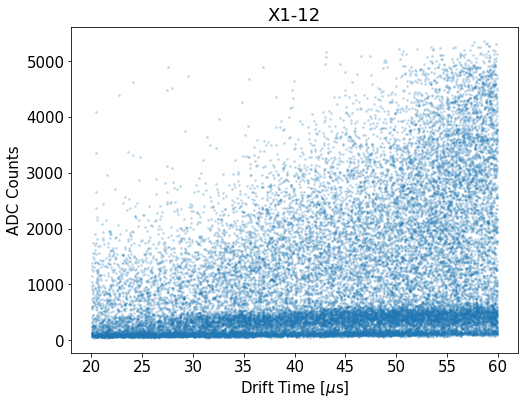

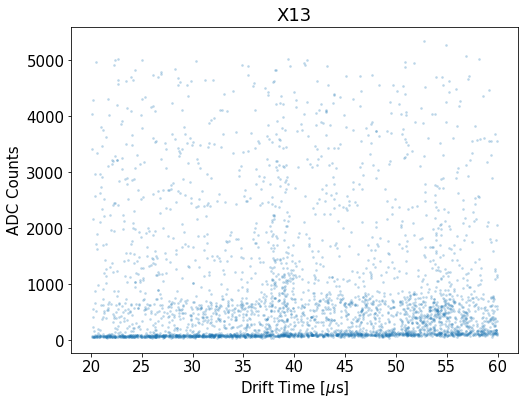

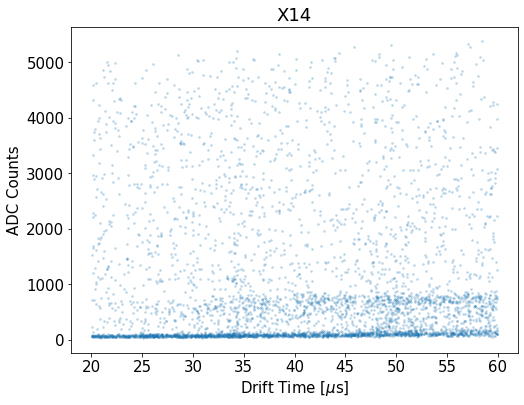

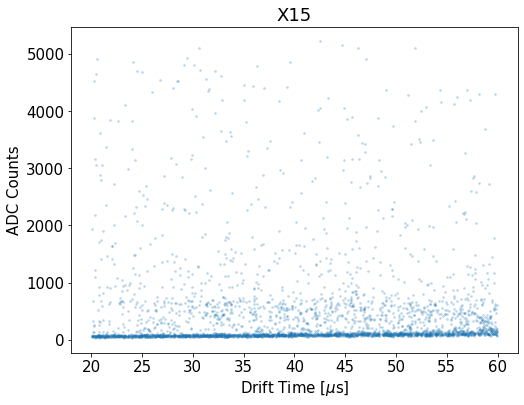

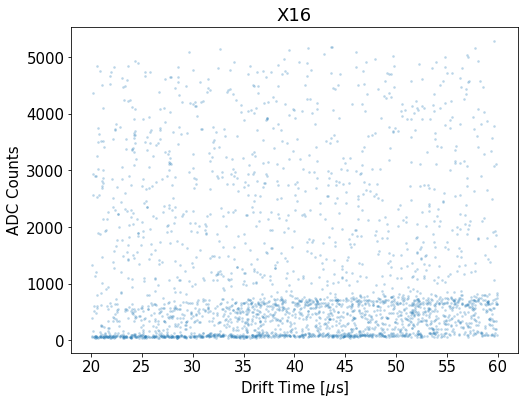

...

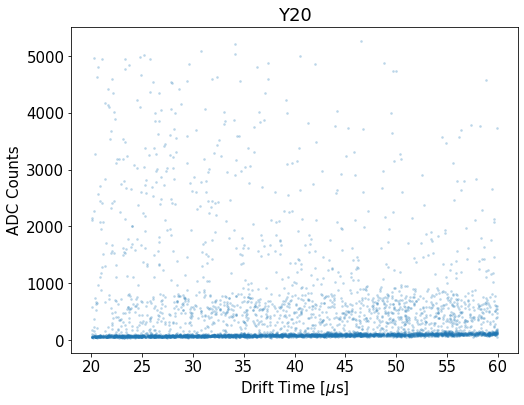

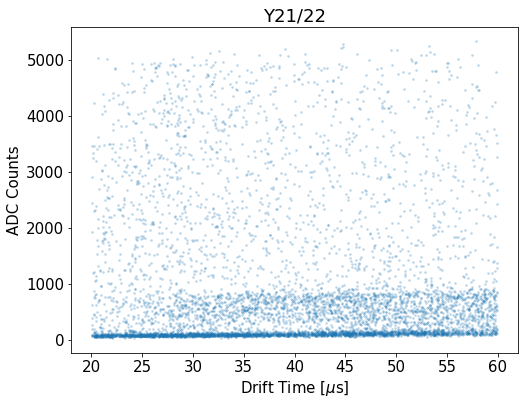

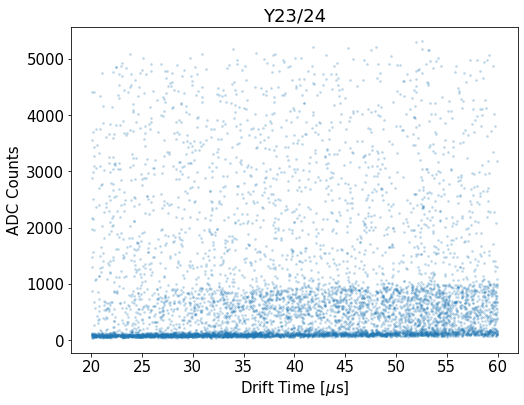

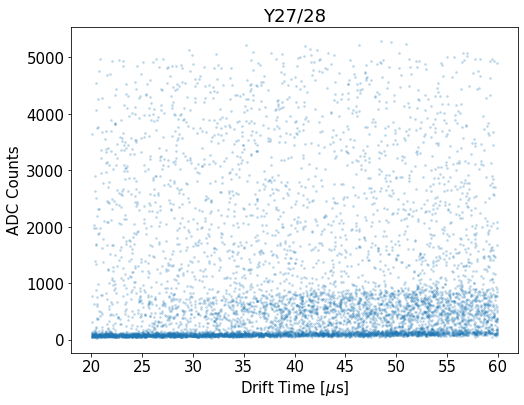

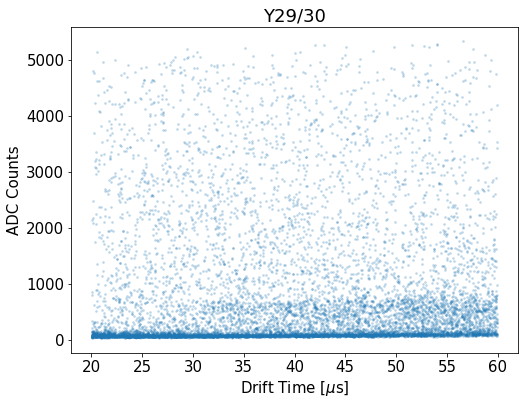

In [11]:
for chan in bn_center.index:
    mask = (alpha_df[alpha_df.keys()[-1]] == chan)
    plt.scatter(DriftTime[mask],alpha_df['TileStrip {} Charge Energy'.format(chan)][mask] * np.exp(DriftTime[mask]/90.0),\
                s=3,alpha=0.2)
    plt.title(chan)
    plt.xlabel('Drift Time [$\mu$s]')
    plt.ylabel('ADC Counts')
    plt.show()

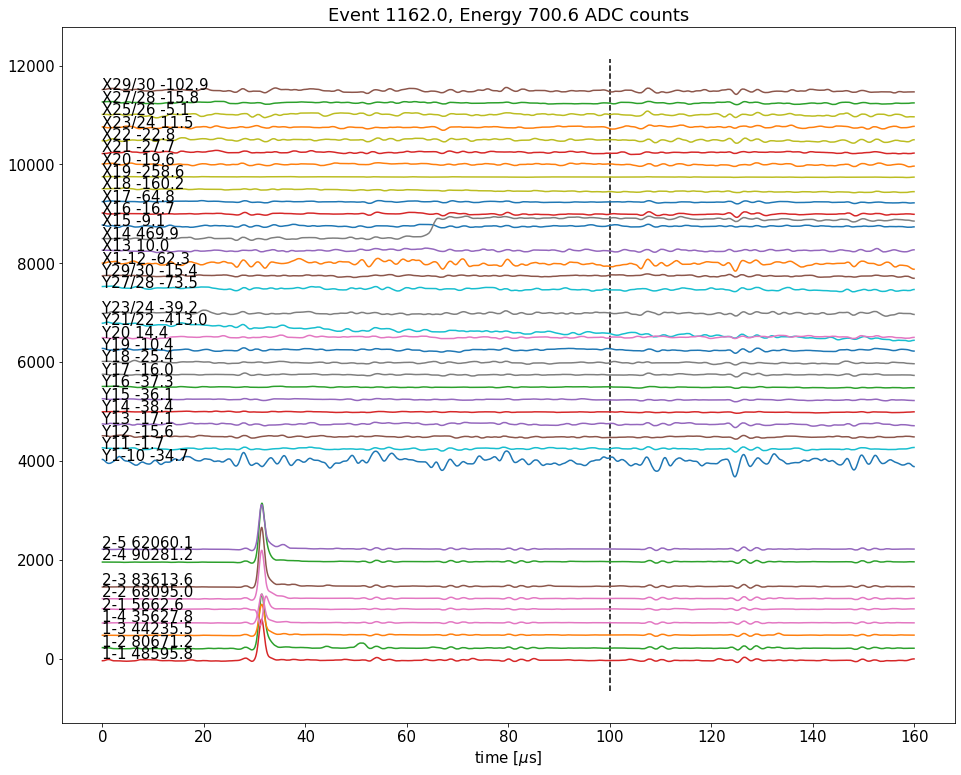

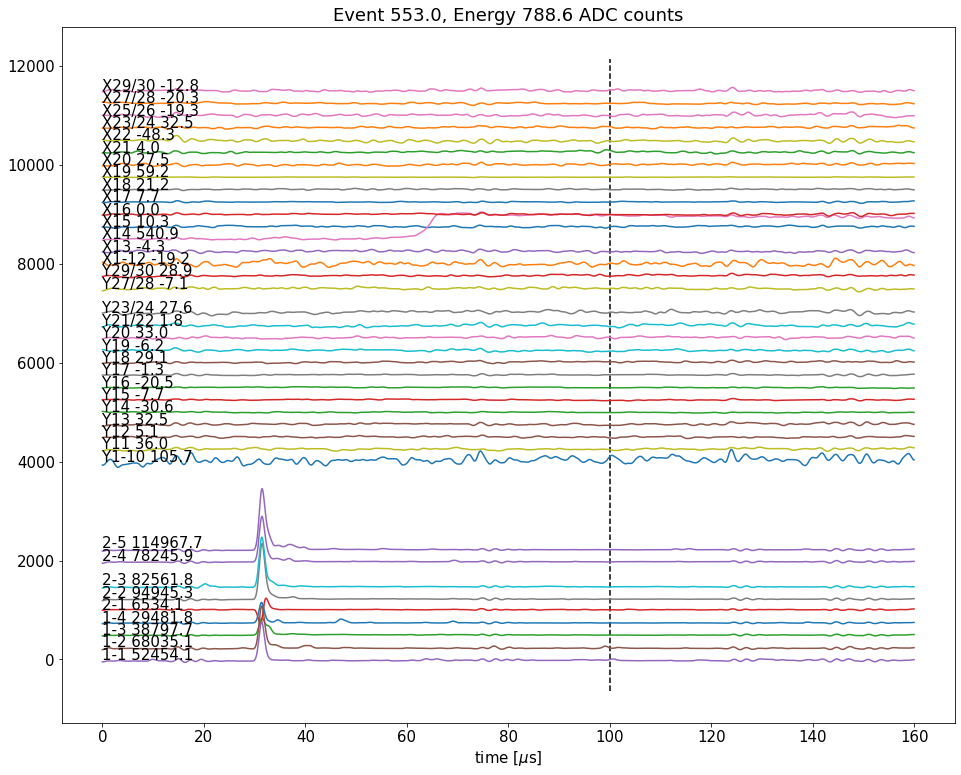

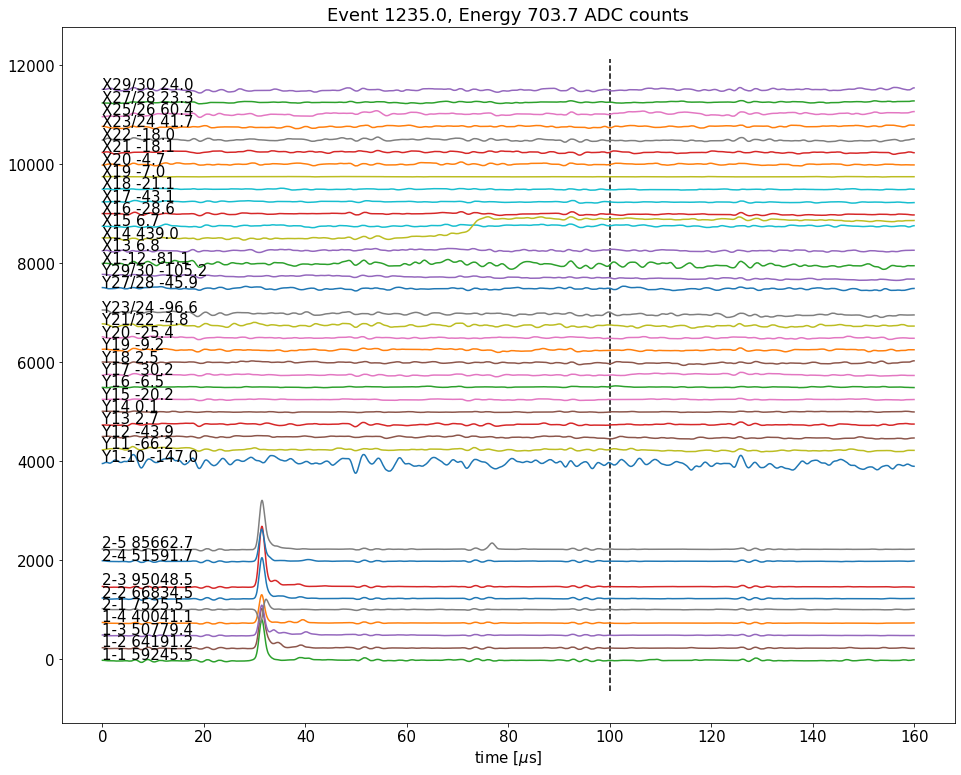

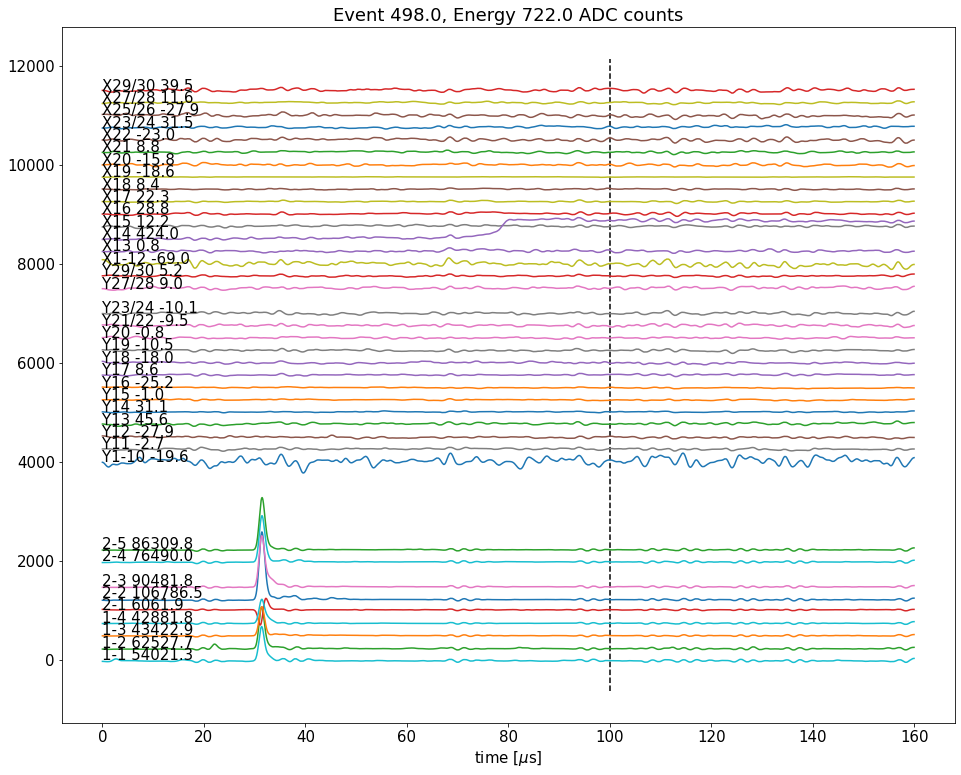

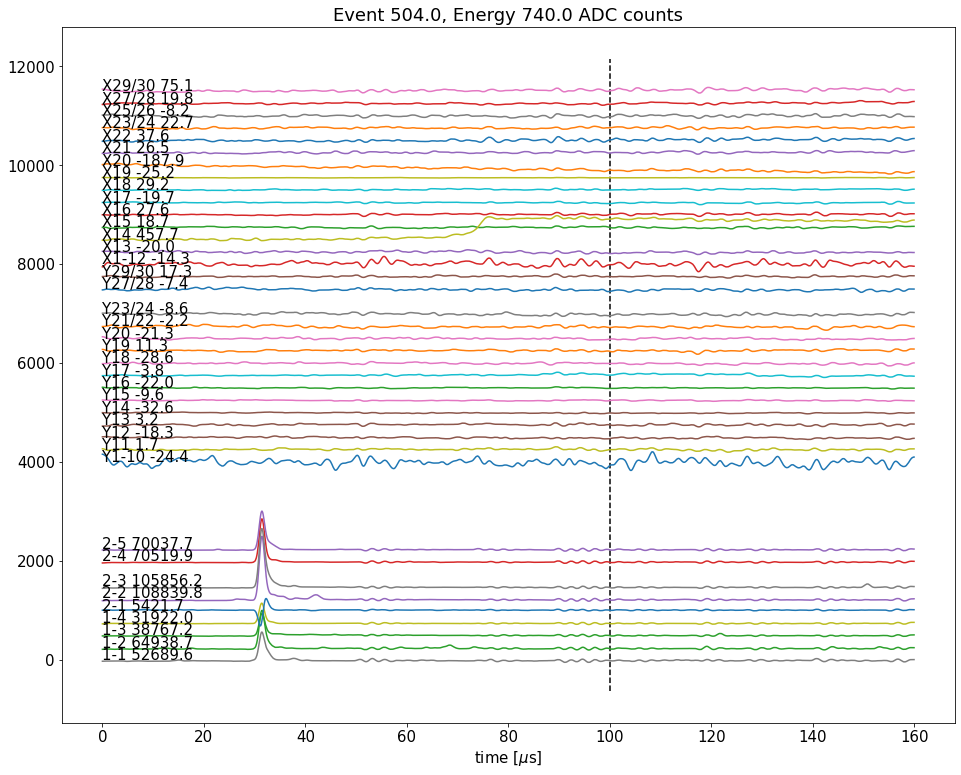

...

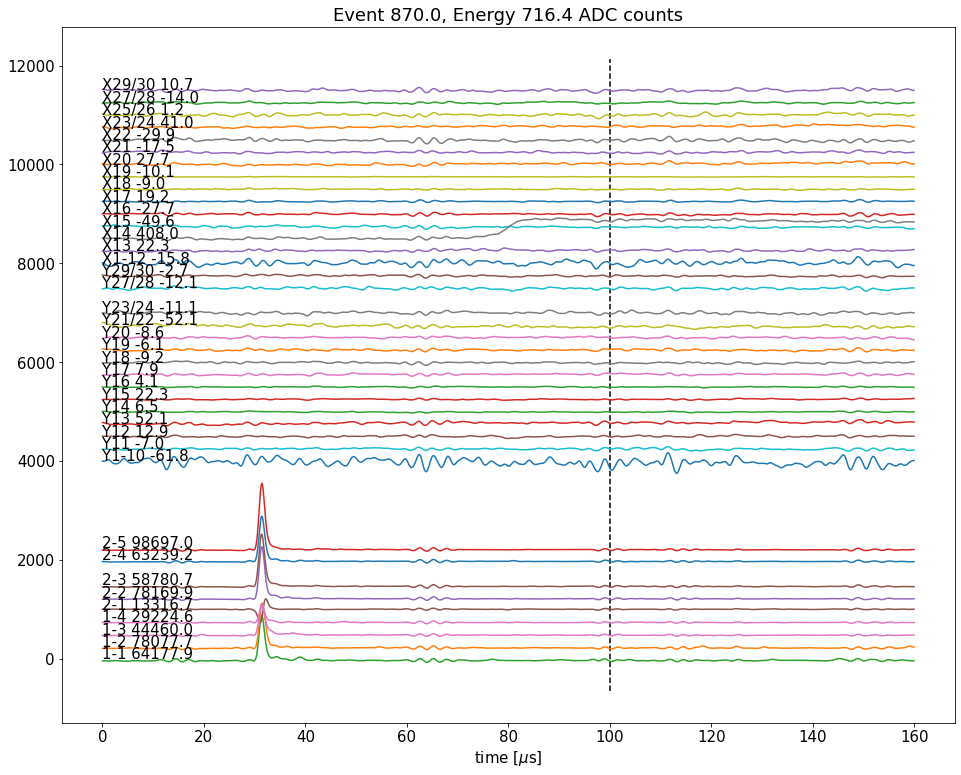

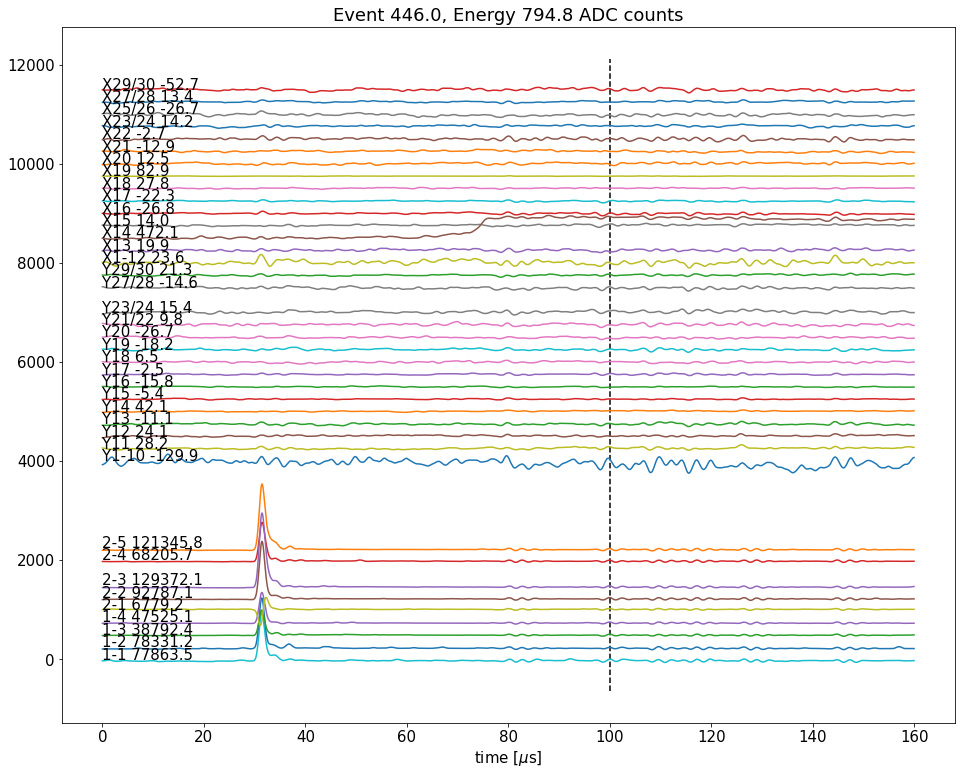

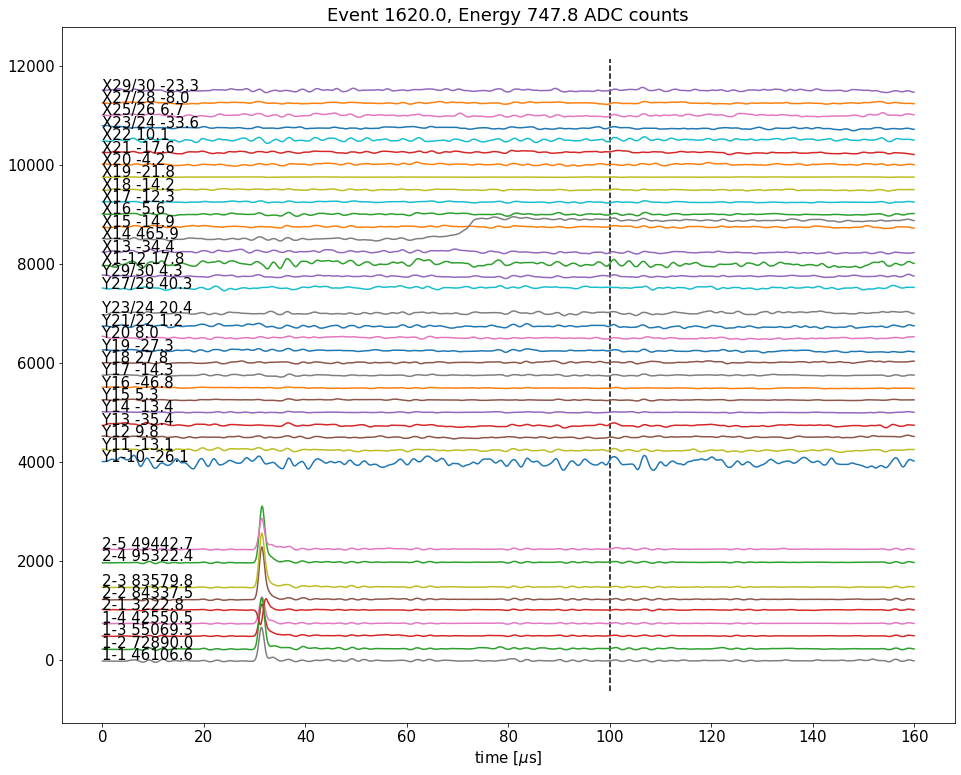

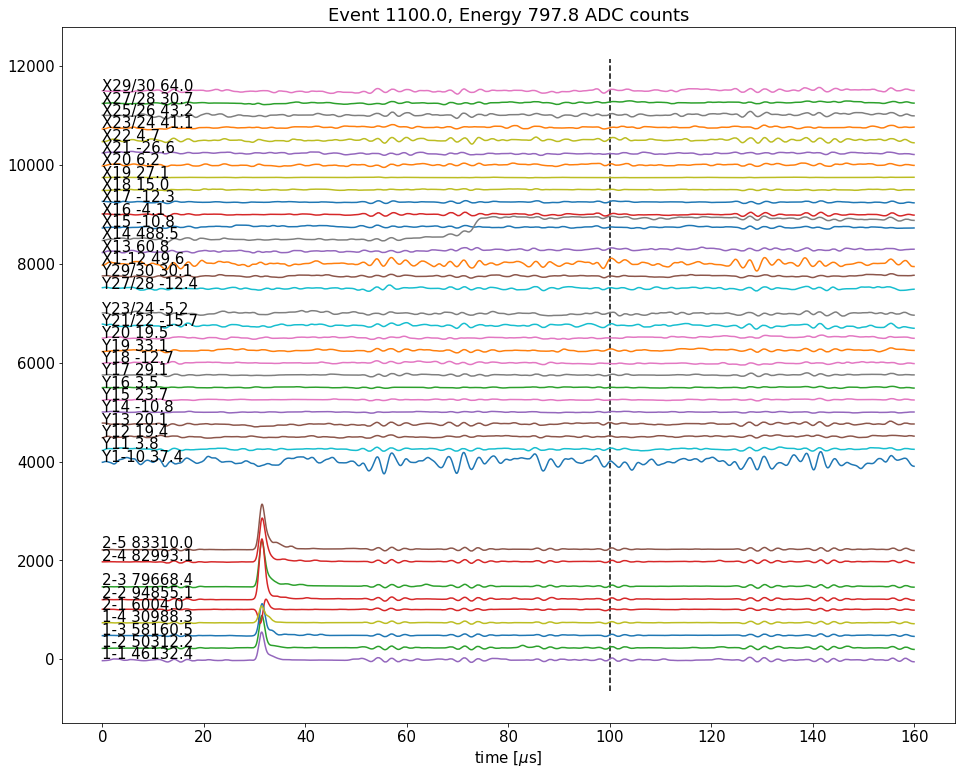

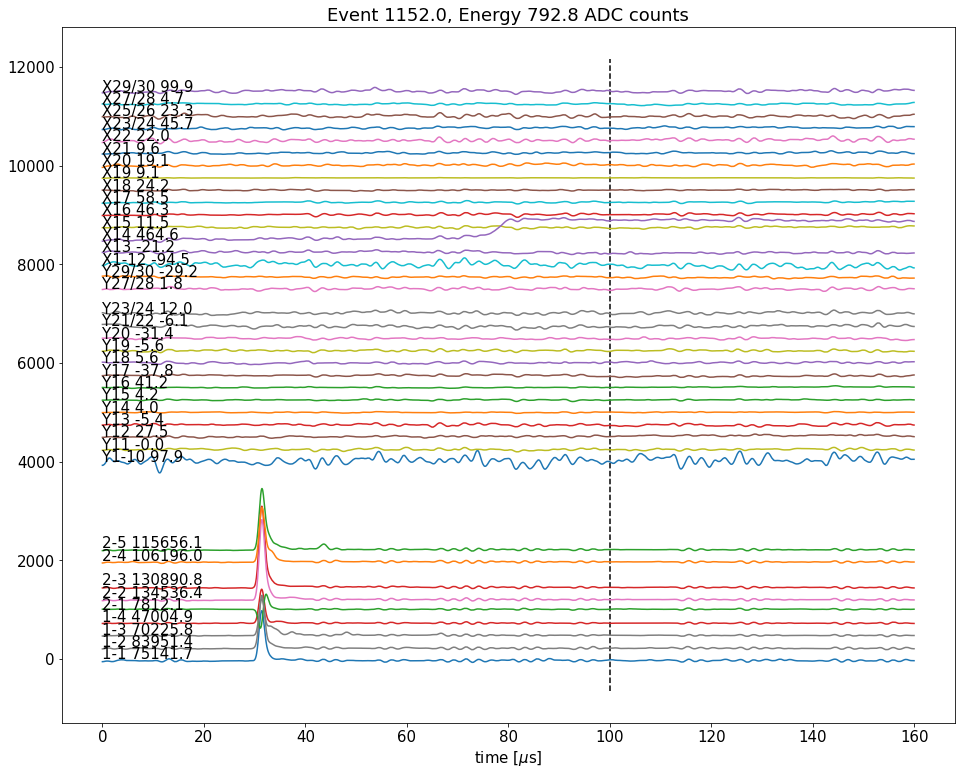

In [ ]:
from TMSAnalysis.StruckAnalysisConfiguration import StruckAnalysisConfiguration

path_to_reduced = '/p/lustre1/jacopod/30th/'
folder = '20200921_Afternoon_AfterFourthInjection/analysis_500ns'
analysis_config = StruckAnalysisConfiguration.StruckAnalysisConfiguration()
analysis_config.GetRunParametersFromFile('/g/g90/jacopod/software/TMSAnalysis/config/30th/Run_Parameters_Run30.xlsx',folder)
analysis_config.GetCalibrationConstantsFromFile('/g/g90/jacopod/software/TMSAnalysis/config/30th/Calibrations_Xe_Run11b.csv')
analysis_config.GetChannelMapFromFile('/g/g90/jacopod/software/TMSAnalysis/config/30th/Channel_Map_Run30.xlsx',folder)



from scipy.ndimage import gaussian_filter
from TMSAnalysis.WaveformAnalysis import Waveform
import uproot
plt.rcParams['figure.figsize'] = [16, 12.8]
plt.rcParams['font.size'] = 15

cut_ix = (alpha_df['TileStrip X14 Charge Energy']* np.exp(DriftTime/90.0)>700) & (alpha_df['TileStrip X14 Charge Energy']* np.exp(DriftTime/90.0)<800)

run_parameters_file = '/g/g90/jacopod/software/TMSAnalysis/config/30th/Run_Parameters_Run30.xlsx'
calibrations_file = '/g/g90/jacopod/software/TMSAnalysis/config/30th/Calibrations_Xe_Run11b.csv'
channel_map_file = '/g/g90/jacopod/software/TMSAnalysis/config/30th/Channel_Map_Run30.xlsx'
for ev in alpha_df.loc[cut_ix].index:
    channel_number = analysis_config.GetNumberOfChannels()
    fname = alpha_df['File'][ev]
    evt = alpha_df['Event'][ev]
    try:
        tier1_tree = uproot.open('{}{}'.format(path_to_reduced + folder.split('/')[0] + '/raw_data/',fname))['HitTree']
    except FileNotFoundError:
        continue
    tier1_ev = tier1_tree.arrays( entrystart=evt*channel_number, entrystop=(evt+1)*channel_number)
    global software_channel 
    software_channel = tier1_ev[b'_slot']*16+tier1_ev[b'_channel']
    if analysis_config.run_parameters['Sampling Rate [MHz]'] == 62.5:
        polarity = 1.

    waveform = np.array(tier1_ev[ b'_waveform'])
    wfm = {}
    #looping through channels and fill the waveforms
    for i,ch_waveform in enumerate(waveform):
        ch_type = analysis_config.GetChannelTypeForSoftwareChannel(software_channel[i])
        ch_name = analysis_config.GetChannelNameForSoftwareChannel(software_channel[i])
        if ch_name == 'Off':
            continue
        wfm[ch_name] = Waveform.Waveform(input_data = gaussian_filter( ch_waveform, 31),\
                                     detector_type       = ch_type,\
                                     sampling_period_ns  = 16.0,\
                                     input_baseline      = -1,\
                                     polarity            = polarity,\
                                     fixed_trigger       = False,\
                                     trigger_position    = analysis_config.run_parameters['Pretrigger Length [samples]'],\
                                     decay_time_us       = analysis_config.GetDecayTimeForSoftwareChannel( software_channel[i] ),\
                                     calibration_constant = analysis_config.GetCalibrationConstantForSoftwareChannel(software_channel[i]))
    ch_offset = 250
    for j in software_channel:
        v = analysis_config.GetChannelNameForSoftwareChannel(j)
        try:
            if analysis_config.GetChannelTypeForSoftwareChannel(j) == 'SiPM':
                suffix = 'Pulse Area'
            elif analysis_config.GetChannelTypeForSoftwareChannel(j) == 'Trigger':
                continue
            else:
                suffix = 'Charge Energy'
            plt.plot(np.arange(len(wfm[v].data))/62.5,wfm[v].data-np.mean(wfm[v].data[:2000])+ch_offset*j)
            en = alpha_df['{} {} '.format(analysis_config.GetChannelTypeForSoftwareChannel(j),analysis_config.GetChannelNameForSoftwareChannel(j)) + suffix][ev]
            plt.text(0,ch_offset*j,'{} {:.1f}'.format(v,en))
        except IndexError:
            continue
    plt.vlines(100,plt.gca().get_ylim()[0],plt.gca().get_ylim()[1],linestyle='dashed')
    plt.xlabel('time [$\mu$s]')
    plt.title('Event {}, Energy {:.1f} ADC counts'.format(evt,alpha_df['TotalTileEnergy'][ev] * np.exp(DriftTime[ev]/90.0)))
    plt.show()